# Load Packages

In [4]:
push!(LOAD_PATH, pwd()) # put current directory on path
using Revise
using UnPack
#include("ModelHelperFuns.jl")  # load the file
#using .ModelHelperFuns         # bring the module into scope
using CooperativeHuntingPkg
using Plots
default(
    guidefontsize=14,   # controls xlabel, ylabel, title font size
    tickfontsize=12,    # controls axis number labels
    legendfontsize=14,  # controls legend font
    linewidth=2,        # controls default line thickness
    grid = false,        # turns off grid in background
    fontfamily="Computer Modern" # font family that matches latex
)
using BifurcationKit, DifferentialEquations
# pgfplotsx()  # Set PGFPlotsX as the backend # this seems to not work on my computer, or on vscode.
using Measures # helps for adjusting location of axis labels
bif_fig_path = "/Users/taliaborofsky/Documents/CH_GroupFormation/CH_manuscript/FIgures/BifurcationDiagrams/"

"/Users/taliaborofsky/Documents/CH_GroupFormation/CH_manuscript/FIgures/BifurcationDiagrams/"

In [5]:
using LaTeXStrings

# Basic Parameters

In [ ]:
params_base = Dict(
    :α1_of_1 => 0.05,
    :α2_of_1 => 0.95,
    :s1 => 2.0,
    :s2 => 2.0,
    :H1a => 0.0,
    :H2a => 0.0,
    :H2b => 0.0,
    :A1 => 0.6,
    :A2 => 0.5,
    :η2 => 0.6,
    :β2 => 1.0,
    :α2_fun_type => "constant",
    :x_max => 5,
    :Tg => .01,
    :d => 100.0,
    :scale => 5.0
)
u0 = [0.1,0.1, fill(0.1,params_base[:x_max])...]
br_list = do_base_continuations(p_nt,5)

7-element Vector{Float64}:
 0.1
 0.1
 0.1
 0.1
 0.1
 0.1
 0.1

# Generate all Figures

below is a summary of the conclusions from all the work done in the rest of the notebook. 

In [ ]:
function make_and_save_nice_plots(br_list, fn_string_base)
    println("hi")
    pltP = plot_nice_bif(br_list, :p, :scale)
    plot!(ylims=[-0.1,2.5])
    savefig(pltP, bif_fig_path*"p_"*fn_string_base*".pdf")
    
    pltN1 = plot_nice_bif(br_list, :N1, :scale)
    savefig(pltN1, bif_fig_path*"N1_"*fn_string_base*".pdf")
    pltN2 = plot_nice_bif(br_list, :N2, :scale)
    savefig(pltN2, bif_fig_path*"N2_"*fn_string_base*".pdf")
    pltxbar = plot_nice_bif(br_list, :mean_x, :scale)
    plot!(ylims=[0.9,4.6])
    savefig(pltxbar, bif_fig_path*"meanx_"*fn_string_base*".pdf")

    pltNsum = plot_nice_bif(br_list, :Nsum, :scale)
    savefig(pltNsum, bif_fig_path*"Nsum_"*fn_string_base*".pdf")

end

make_and_save_nice_plots (generic function with 1 method)

In [44]:
# type II, vary scale
params = copy(params_base)
params[:H1a] = params[:H2a] = 0.0
params[:H2b] = 1.0
println(params)
x_max = params[:x_max]
u0 = fill(0.1, x_max+2)
p_nt = NamedTuple(scale_parameters(params))
br_list = do_base_continuations(p_nt, 5);
fn_string_base = "varyratio_type2"
pltxbar = plot_nice_bif(br_list, :mean_x, :scale)
plot!(ylims=[.9,4.6])
savefig(pltxbar, bif_fig_path*"p_"*fn_string_base*".pdf")
#make_and_save_nice_plots(br_list, "varyratio_type2")

Dict{Symbol, Any}(:A1 => 0.6, :α1_of_1 => 0.05, :β2 => 1.0, :H2b => 1.0, :Tg => 0.01, :d => 100.0, :A2 => 0.5, :s1 => 2.0, :H1a => 0.0, :H2a => 0.0, :scale => 5.0, :x_max => 5, :α2_of_1 => 0.95, :η2 => 0.6, :α2_fun_type => "constant", :s2 => 2.0)


"/Users/taliaborofsky/Documents/CH_GroupFormation/CH_manuscript/FIgures/BifurcationDiagrams/p_varyratio_type2.pdf"

In [42]:
# type I, Scaled
    params = copy(params_base)
    params[:H1a] = params[:H2a] = params[:H2b] = 0
    p_nt = NamedTuple(scale_parameters(params))
    br_list = do_base_continuations(p_nt,5);
    make_and_save_nice_plots(br_list, "varyratio_type1")


# type II, vary scale
    params = copy(params_base)
    params[:H1a] = params[:H2a] = 0.0
    params[:H2b] = 1.0
    println(params)
    x_max = params[:x_max]
    u0 = fill(0.1, x_max+2)
    p_nt = NamedTuple(scale_parameters(params))
    br_list = do_base_continuations(p_nt, 5);
    make_and_save_nice_plots(br_list, "varyratio_type2")

# type II, vary η2
    params = copy(params_base)
    params[:H1a] = params[:H2a] = 0.0
    params[:H2b] = 1.0
    params[:scale] = 4.0
    η2_upper = 6.0/7.0
    p_nt = NamedTuple(scale_parameters(params))
    br_list = do_base_continuations(p_nt,5; lens = (@optic _.η2), p_min = 0.01, 
p_max = η2_upper)
    br_P_extinct_extra = continuation(br_list.predator_extinct,2;bothside=true)
    br_list = (br_list..., predator_extinct2 = br_P_extinct_extra);
    make_and_save_nice_plots(br_list, "varyeta2_type2")

# type II, vary A1
    params = copy(params_base)
    params[:H1a] = params[:H2a] = 0.0
    params[:H2b] = 1.0
    params[:scale] = 6.0
    params[:A1]=0.6
    p_nt = NamedTuple(scale_parameters(params))
    br_list = do_base_continuations(p_nt, 5; lens = (@optic _.A1), 
        p_min = 0.5, p_max = 1.5)
    make_and_save_nice_plots(br_list, "varyA1_type2")
# type II, vary Tg
    params = copy(params_base)
    params[:H1a] = params[:H2a] = 0.0
    params[:H2b] = 1.0
    params[:scale] = 6.0
    params[:A1]=0.6
    params[:Tg] = 0.1
    p_nt = NamedTuple(scale_parameters(params))
    br_list = do_base_continuations(p_nt, 5; lens = (@optic _.Tg), 
        p_min = 0.001, p_max = 1.0)
        
    plt_meanx = plot_nice_bif(br_list, :mean_x, :Tg)
    plot!(xscale = :log)
    plot!(xlabel = "Relative Group Dynamics \nTimescale, "*L"T_g")

    pltN1 = plot_nice_bif(br_list, :N1, :Tg)
    plot!(xscale = :log)
    plot!(xlabel = "Relative Group Dynamics \nTimescale, "*L"T_g")


    pltN2 = plot_nice_bif(br_list, :N2, :Tg)
    plot!(xscale = :log)

    pltNsum = plot_nice_bif(br_list, :Nsum, :Tg)
    plot!(xscale = :log)
    plot!(xlabel = "Relative Group Dynamics \nTimescale, "*L"T_g")


    pltP = plot_nice_bif(br_list, :p, :Tg)
    plot!(xscale = :log)
    plot!(xlabel = "Relative Group Dynamics \nTimescale, "*L"T_g")

    savefig(plt_meanx, bif_fig_path*"meanx_varyTg_type2.pdf")
    savefig(pltN1, bif_fig_path*"N1_varyTg_type2.pdf")
    savefig(pltN2, bif_fig_path*"N2_varyTg_type2.pdf")
    savefig(pltNsum, bif_fig_path*"Nsum_varyTg_type2.pdf")
    savefig(pltP, bif_fig_path*"p_varyTg_type2.pdf")


    
    

hi
Dict{Symbol, Any}(:A1 => 0.6, :α1_of_1 => 0.05, :β2 => 1.0, :H2b => 1.0, :Tg => 0.01, :d => 100.0, :A2 => 0.5, :s1 => 2.0, :H1a => 0.0, :H2a => 0.0, :scale => 5.0, :x_max => 5, :α2_of_1 => 0.95, :η2 => 0.6, :α2_fun_type => "constant", :s2 => 2.0)
hi
hi
hi


"/Users/taliaborofsky/Documents/CH_GroupFormation/CH_manuscript/FIgures/BifurcationDiagrams/p_varyTg_type2.pdf"

# Type I Fun Response, Scaled

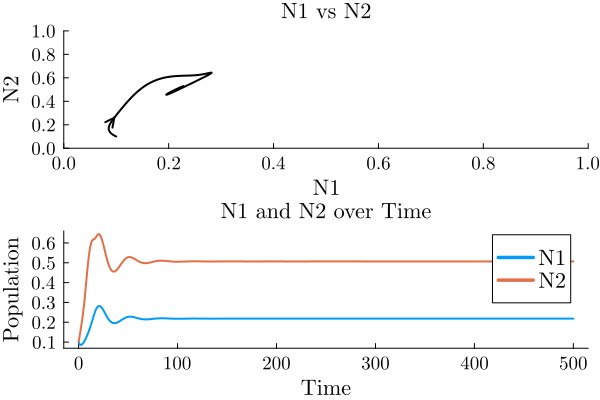

In [7]:
params = copy(params_base)
params[:H1a] = params[:H2a] = params[:H2b] = 0

p_nt = NamedTuple(scale_parameters(params))
sol, plotN1N2 = simulate_and_plot(u0, p_nt; tf = 500)
display(plotN1N2)

In [8]:
br_list = do_base_continuations(p_nt,5)

(coexist =  ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 615
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter scale starts at 0.8683148017292457, ends at 8.0
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at scale ≈ +0.86671513,                                                                     step =  -1
- #  2,       bp at scale ≈ +1.46221503 ∈ (+1.46221503, +1.46221536), |δp|=3e-07, [converged], δ = (-1,  0), step = 147
- #  3,       bp at scale ≈ +1.55694099 ∈ (+1.55694099, +1.55694258), |δp|=2e-06, [converged], δ = (-1,  0), step = 155
- #  4, endpoint at scale ≈ +8.00000000,                                                                     step = 614
, predator_extinct =  ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 562
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter scale starts at 0.1, ends at 8.0
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at scale ≈ +0.10000000,                                                                     step =  

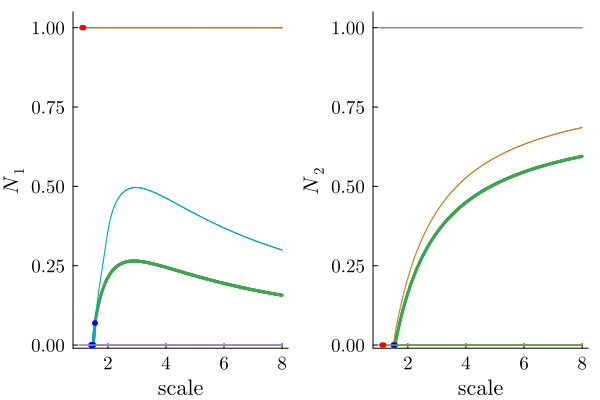

2-element Vector{Any}:
 Plot{Plots.GRBackend() n=12}
 Plot{Plots.GRBackend() n=12}

In [6]:
plot_branches(br_list)

## Nice Plots

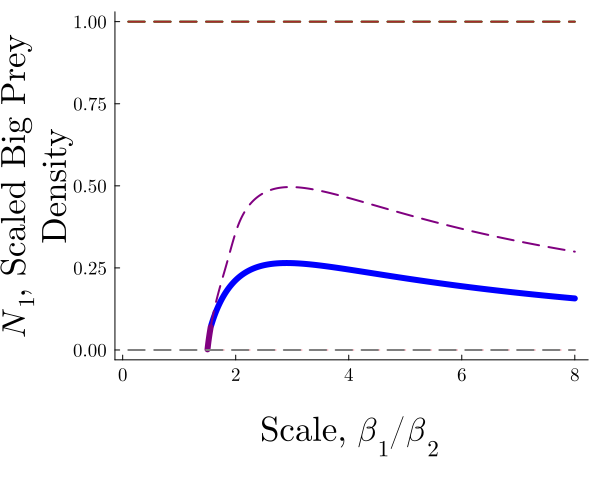

In [10]:
pltN1 = plot_nice_bif(br_list, :N1, :scale)


In [12]:
pltP = plot_nice_bif(br_list, :p, :scale)
savefig(pltP, bif_fig_path*"p_varyratio_type1.pdf")
pltN1 = plot_nice_bif(br_list, :N1, :scale)
savefig(pltN1, bif_fig_path*"N1_varyratio_type1.pdf")
pltN2 = plot_nice_bif(br_list, :N2, :scale)
savefig(pltN2, bif_fig_path*"N2_varyratio_type1.pdf")
pltxbar = plot_nice_bif(br_list, :mean_x, :scale)
plot!(pltxbar, legend=:right)
savefig(pltxbar, bif_fig_path*"meanx_varyratio_type1.pdf")
pltNsum = plot_nice_bif(br_list, :Nsum, :scale)
savefig(pltNsum, bif_fig_path*"Nsum_varyratio_type1.pdf")

"/Users/taliaborofsky/Documents/CH_GroupFormation/CH_manuscript/FIgures/BifurcationDiagrams/Nsum_varyratio_type1.pdf"

number of branches in the diagram

In [65]:
diagram.γ.branch
get_branch(diagram, ()).γ
propertynames(diagram)
propertynames(br)
br.specialpoint[3]

342-element StructArray(::Vector{Float64}, ::Vector{Float64}, ::Vector{Float64}, ::Vector{Float64}, ::Vector{Float64}, ::Vector{Float64}, ::Vector{Float64}, ::Vector{Float64}, ::Vector{Int64}, ::Vector{Int64}, ::Vector{Float64}, ::Vector{Int64}, ::Vector{Int64}, ::Vector{Bool}, ::Vector{Int64}) with eltype @NamedTuple{N1::Float64, N2::Float64, g1::Float64, g2::Float64, g3::Float64, g4::Float64, g5::Float64, param::Float64, itnewton::Int64, itlinear::Int64, ds::Float64, n_unstable::Int64, n_imag::Int64, stable::Bool, step::Int64}:
 (N1 = 0.21836035146364252, N2 = 0.5068001155062819, g1 = 0.4196360093359236, g2 = 0.12855480306678424, g3 = 0.0745839172498431, g4 = 0.00021421471805437272, g5 = 3.8341093340993844e-7, param = 5.0, itnewton = 0, itlinear = 0, ds = -0.001, n_unstable = 0, n_imag = 0, stable = 1, step = 0)
 (N1 = 0.21839691119655788, N2 = 0.5067349182227856, g1 = 0.41966949489775834, g2 = 0.12857969666225072, g3 = 0.07460779491790831, g4 = 0.00021431222477407306, g5 = 3.8354221

# Type II, Vary Scale

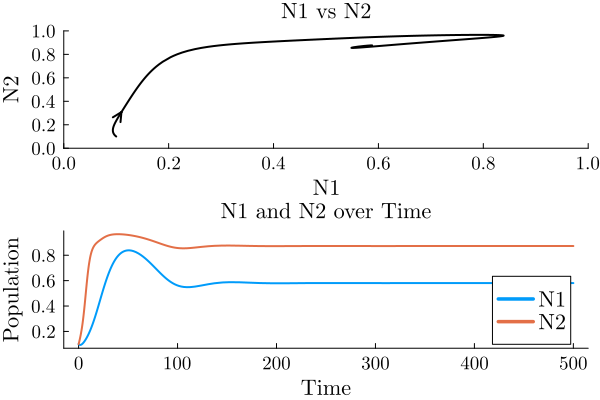

Dict{Symbol, Any}(:A1 => 0.6, :α1_of_1 => 0.05, :β2 => 1.0, :H2b => 1.0, :Tg => 0.01, :d => 100.0, :A2 => 0.5, :s1 => 2.0, :H1a => 0.0, :H2a => 0.0, :scale => 5.0, :x_max => 5, :α2_of_1 => 0.95, :η2 => 0.6, :α2_fun_type => "constant", :s2 => 2.0)


In [27]:
params = copy(params_base)
params[:H1a] = params[:H2a] = 0.0
params[:H2b] = 1.0
println(params)
x_max = params[:x_max]
u0 = fill(0.1, x_max+2)
p_nt = NamedTuple(scale_parameters(params))
sol, plotN1N2 = simulate_and_plot(u0, p_nt; tf = 500)
display(plotN1N2)

In [28]:
br_list = do_base_continuations(p_nt, 5)

(coexist =  ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 531
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter scale starts at 1.01, ends at 8.0
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at scale ≈ +1.01000000,                                                                     step =   0
- #  2,       bp at scale ≈ +1.46252346 ∈ (+1.46252346, +1.46252346), |δp|=3e-10, [converged], δ = (-1,  0), step =  60
- #  3,       bp at scale ≈ +1.55742547 ∈ (+1.55742547, +1.55742702), |δp|=2e-06, [converged], δ = (-1,  0), step =  69
- #  4, endpoint at scale ≈ +8.00000000,                                                                     step = 530
, predator_extinct =  ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 498
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter scale starts at 1.01, ends at 8.0
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at scale ≈ +1.01000000,                                                                     step =   0
- #  2, en

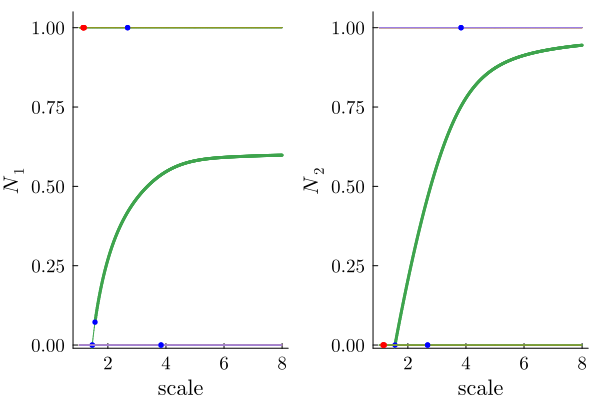

2-element Vector{Any}:
 Plot{Plots.GRBackend() n=13}
 Plot{Plots.GRBackend() n=13}

In [6]:
plot_branches(br_list)

### A few simulations

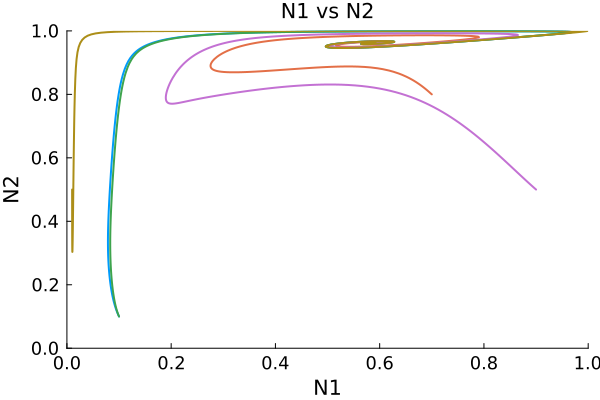

In [152]:
tf = 1000
tspan = (0.0, tf)
params[:scale ]= 11
p_nt = NamedTuple(scale_parameters(params))

starting_points = [ fill(0.1, x_max + 2),
                    [0.7, 0.8, fill(0.1,x_max)...],
                    [0.1, 0.1, fill(0.2,x_max-2)..., 0.01, 0.01],
                    [0.9, 0.5, 0.01, 1.0, 0.01, 0.01, 0.01],
                    [0.01, 0.5, 0.01, 1.0, 0.01, 0.01, 0.01]]
plt = plot()
for u0 in starting_points
    prob = ODEProblem(fullsystem_scaled!, u0, tspan, p_nt)
    sol = solve(prob)

    # Extract N1 and N2 from the solution
    N1 = sol[1, :]  # First component of the solution
    N2 = sol[2, :]  # Second component of the solution
    plot!(N1, N2, xlabel="N1", ylabel="N2", title="N1 vs N2", legend=false, 
            xlims = (0,1), ylims = (0,1))
end
display(plt)

## Check Bifurcation Points

### Coexistence

In [17]:
br_co = br_list.coexist
println(br_co)
println(br_co.specialpoint[2].x)
println(br_co.specialpoint[3].x)
br_co_extra = continuation(br_co,3;bothside=true)


 ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 531
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter scale starts at 1.01, ends at 8.0
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at scale ≈ +1.01000000,                                                                     step =   0
- #  2,       bp at scale ≈ +1.46252346 ∈ (+1.46252346, +1.46252346), |δp|=3e-10, [converged], δ = (-1,  0), step =  60
- #  3,       bp at scale ≈ +1.55742547 ∈ (+1.55742547, +1.55742702), |δp|=2e-06, [converged], δ = (-1,  0), step =  69
- #  4, endpoint at scale ≈ +8.00000000,                                                                     step = 530

[-1.0277426920439636e-10, -0.04995648711111263, 0.5121444567111919, 0.23468487539950467, 0.2165985372037629, 0.18376292211299355, 0.14081169364749738]
[0.0722290581001968, -3.7811116948617485e-9, 0.5505438868628232, 0.27707981338860693, 0.28233207805454724, 0.14165442921293578, 0.04156265073454036]


 ┌─ Curve type: EquilibriumCont from Transcritical bifurcation point.
 ├─ Number of points: 471
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter scale starts at 7.152754676464627, ends at 1.01
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at scale ≈ +7.16689568,                                                                     step =  -1
- #  2,       bp at scale ≈ +1.55742573 ∈ (+1.55742534, +1.55742573), |δp|=4e-07, [converged], δ = ( 1,  0), step = 399
- #  3,       bp at scale ≈ +1.46252346 ∈ (+1.46252346, +1.46252346), |δp|=6e-10, [converged], δ = ( 1,  0), step = 410
- #  4, endpoint at scale ≈ +1.01000000,                                                                     step = 470


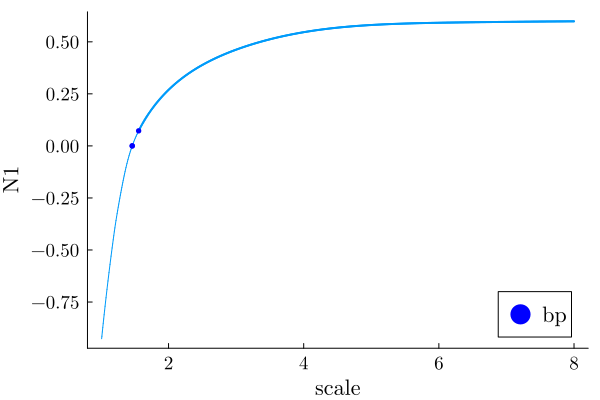

In [18]:
plot(br_co)

### Predator Extinct

In [19]:
br_P_extinct = br_list.predator_extinct
println(br_P_extinct)

 ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 498
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter scale starts at 1.01, ends at 8.0
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at scale ≈ +1.01000000,                                                                     step =   0
- #  2, endpoint at scale ≈ +8.00000000,                                                                     step = 497



### Big Prey extinct

In [7]:
br_N1_extinct = br_list.N1_extinct
println(br_N1_extinct)
println(br_N1_extinct.specialpoint[2].x)


 ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 498
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter scale starts at 1.01, ends at 8.0
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at scale ≈ +1.01000000,                                                                     step =   0
- #  2,       bp at scale ≈ +3.83114869 ∈ (+3.83114869, +3.83115042), |δp|=2e-06, [converged], δ = (-1,  0), step = 200
- #  3, endpoint at scale ≈ +8.00000000,                                                                     step = 497

[0.0, 1.0, 3.548962169877112e-18, -1.0982840952336072e-18, 4.9604366973579964e-20, -4.0763460586613204e-21, 6.154223757394526e-22]


┌ Error: Failure to converge with given tolerance = 1.0e-12.
│ Step = 237
│ You can decrease the tolerance or pass a different norm using the argument `normC`.
│  We reached the smallest value [dsmin] valid for ds, namely 0.0001.
│  Stopping continuation at continuation step 237.
└ @ BifurcationKit /Users/taliaborofsky/.julia/packages/BifurcationKit/Eq8JI/src/continuation/Contbase.jl:67
┌ Warning: No strict ticks found
└ @ PlotUtils /Users/taliaborofsky/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils /Users/taliaborofsky/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils /Users/taliaborofsky/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils /Users/taliaborofsky/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils /Users/taliaborofsky/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict tick

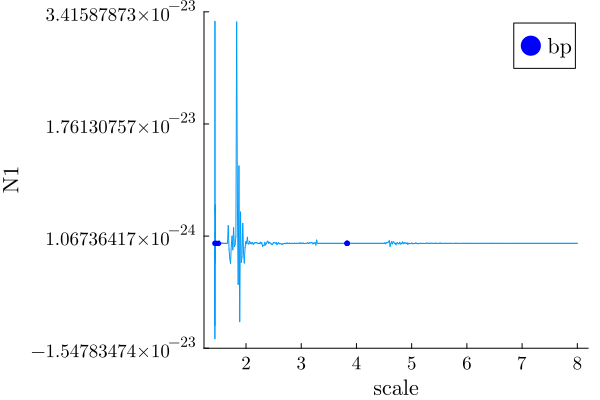

In [11]:
br_N1_extra = continuation(br_N1_extinct,2;bothside=true)
plot(br_N1_extra)

### Small Prey extinct

In [13]:
br_N2_extinct = br_list.N2_extinct

 ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 499
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter scale starts at 1.01, ends at 8.0
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at scale ≈ +1.01000000,                                                                     step =   0
- #  2,     hopf at scale ≈ +1.14843254 ∈ (+1.14843254, +1.14846016), |δp|=3e-05, [converged], δ = (-2, -2), step =  10
- #  3,     hopf at scale ≈ +1.18497560 ∈ (+1.18497560, +1.18498941), |δp|=1e-05, [converged], δ = (-2, -2), step =  13
- #  4,       bp at scale ≈ +2.68021642 ∈ (+2.68021642, +2.68021653), |δp|=1e-07, [converged], δ = (-1,  0), step = 119
- #  5, endpoint at scale ≈ +8.00000000,                                                                     step = 498


In [14]:
hopf_pt = br_N2_extinct.specialpoint[2].x
hopf_pt = map(x -> x<1e-10 ? 0.0 : x, hopf_pt)
hopf_pt = map(x -> x>1 ? 1.0 : x, hopf_pt)

7-element Vector{Float64}:
 1.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

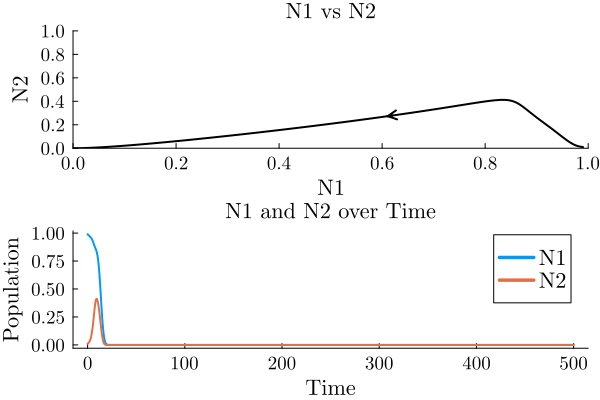

In [15]:
params[:scale] = 1.14
p_nt = NamedTuple(scale_parameters(params))
sol, plotN1N2 = simulate_and_plot([.99, fill(.01,x_max+1)...], p_nt; tf = 500)
display(plotN1N2)

the hopf bifurcation point in the plot is not in a valid range

Checking bifurcation points to see if any of them can be branched from

In [16]:
 br_N2_extinct.specialpoint[3].x


7-element Vector{Float64}:
  1.000000000000184
  0.0
 -1.8920384495792607e-14
 -2.3672904252407188e-14
 -4.805808804589862e-14
  3.107984192775142e-14
 -6.166510465941073e-14

┌ Error: Newton failed to fully locate bifurcation point using bisection parameters!
└ @ BifurcationKit /Users/taliaborofsky/.julia/packages/BifurcationKit/Eq8JI/src/Bifurcations.jl:204
┌ Warning: Error in eigenvalues computation. It seems that an eigenvalue is missing, probably conj(λ) for some already computed eigenvalue λ. This makes the identification (but not the detection) of bifurcation points erroneous. You should increase the number of requested eigenvalues `nev`.
└ @ BifurcationKit /Users/taliaborofsky/.julia/packages/BifurcationKit/Eq8JI/src/Bifurcations.jl:113


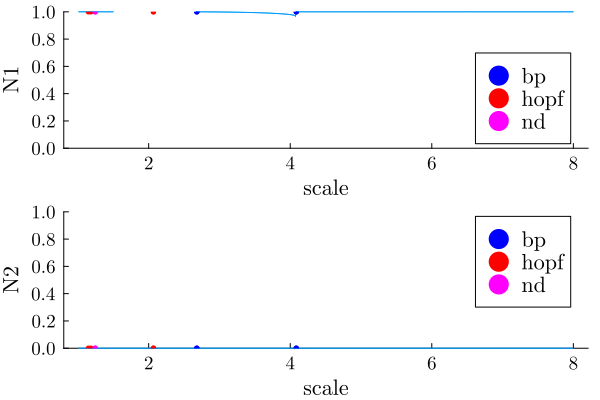

In [17]:
n2_br = continuation(br_N2_extinct, 4; bothside = true)
plot1 = plot(n2_br,ylims = [0,1])
plot2 = plot(n2_br, vars = (:param, :N2), ylims = [0,1])
plot(plot1, plot2, layout = (2,1))

### Big prey and predator extinct

In [29]:
br_list.N1P_extinct

 ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 499
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter scale starts at 1.01, ends at 8.0
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at scale ≈ +1.01000000,                                                                     step =   0
- #  2,     hopf at scale ≈ +1.14843254 ∈ (+1.14843254, +1.14846016), |δp|=3e-05, [converged], δ = (-2, -2), step =  10
- #  3,     hopf at scale ≈ +1.18497560 ∈ (+1.18497560, +1.18498941), |δp|=1e-05, [converged], δ = (-2, -2), step =  13
- #  4,       bp at scale ≈ +2.68021642 ∈ (+2.68021642, +2.68021653), |δp|=1e-07, [converged], δ = (-1,  0), step = 119
- #  5, endpoint at scale ≈ +8.00000000,                                                                     step = 498


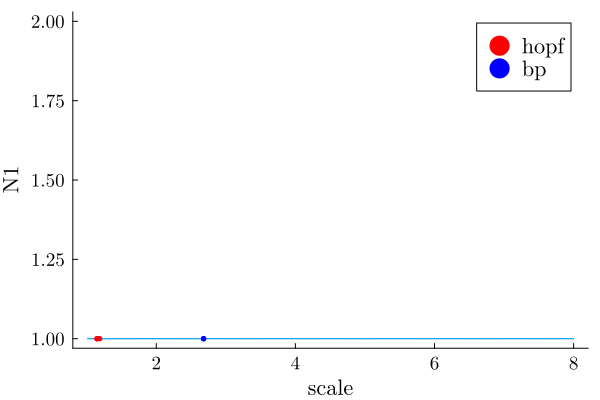

In [ ]:
plot(br_list.N1bP_extinct)

In [30]:
br_po = continuation(br_list.N1P_extinct, 3, ContinuationPar(),
        PeriodicOrbitOCollProblem(20, 5)
        )

MethodError: MethodError: no method matching Float64(::ForwardDiff.Dual{ForwardDiff.Tag{BifurcationKit.var"#630#636"{BifurcationProblem{BifFunction{typeof(fullsystem_scaled), BifurcationKit.var"#104#122"{typeof(fullsystem_scaled)}, BifurcationKit.var"#108#126"{typeof(fullsystem_scaled)}, Nothing, BifurcationKit.var"#105#123"{typeof(fullsystem_scaled)}, Nothing, BifurcationKit.var"#107#125"{BifurcationKit.var"#105#123"{typeof(fullsystem_scaled)}}, BifurcationKit.var"#111#130"{BifurcationKit.var"#d1Fad#128"{typeof(fullsystem_scaled)}}, BifurcationKit.var"#113#132", BifurcationKit.var"#115#134", BifurcationKit.var"#117#136", Bool, Float64, BifurcationKit.Jet{Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}}, Vector{Float64}, @NamedTuple{A1::Float64, α1_of_1::Float64, β2::Float64, H2b::Float64, Tg::Float64, d::Float64, β1::Float64, η1::Float64, H1b::Float64, A2::Float64, s1::Float64, H1a::Float64, H2a::Float64, scale::Float64, x_max::Int64, α2_of_1::Float64, η2::Float64, α2_fun_type::String, s2::Float64}, PropertyLens{:scale}, typeof(BifurcationKit.plot_default), typeof(recordFromSolution), typeof(BifurcationKit.save_solution_default)}, @NamedTuple{A1::Float64, α1_of_1::Float64, β2::Float64, H2b::Float64, Tg::Float64, d::Float64, β1::Float64, η1::Float64, H1b::Float64, A2::Float64, s1::Float64, H1a::Float64, H2a::Float64, scale::Float64, x_max::Int64, α2_of_1::Float64, η2::Float64, α2_fun_type::String, s2::Float64}, PropertyLens{:scale}, Vector{Float64}}, Float64}, Float64, 1})
The type `Float64` exists, but no method is defined for this combination of argument types when trying to construct it.

Closest candidates are:
  (::Type{T})(::Real, !Matched::RoundingMode) where T<:AbstractFloat
   @ Base rounding.jl:265
  (::Type{T})(::T) where T<:Number
   @ Core boot.jl:900
  Float64(!Matched::UInt8)
   @ Base float.jl:245
  ...


I assume I'm getting this problem because of the hopf bifurcation being around 0

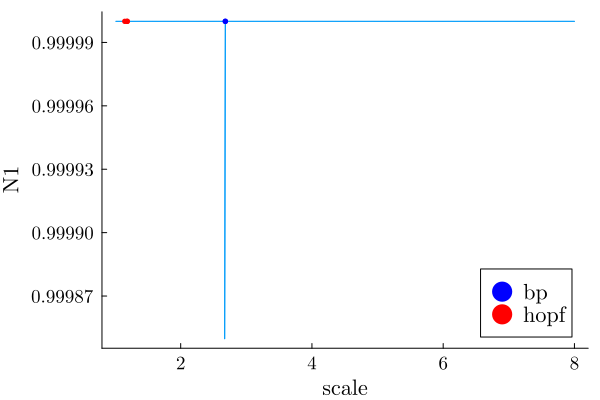

In [32]:
plot(continuation(br_list.N1P_extinct, 4; bothside = true))

 ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 498
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter scale starts at 1.01, ends at 8.0
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at scale ≈ +1.01000000,                                                                     step =   0
- #  2,       bp at scale ≈ +3.83114869 ∈ (+3.83114869, +3.83115042), |δp|=2e-06, [converged], δ = (-1,  0), step = 200
- #  3, endpoint at scale ≈ +8.00000000,                                                                     step = 497



┌ Error: Failure to converge with given tolerance = 1.0e-12.
│ Step = 237
│ You can decrease the tolerance or pass a different norm using the argument `normC`.
│  We reached the smallest value [dsmin] valid for ds, namely 0.0001.
│  Stopping continuation at continuation step 237.
└ @ BifurcationKit /Users/taliaborofsky/.julia/packages/BifurcationKit/Eq8JI/src/continuation/Contbase.jl:67
┌ Warning: No strict ticks found
└ @ PlotUtils /Users/taliaborofsky/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils /Users/taliaborofsky/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils /Users/taliaborofsky/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils /Users/taliaborofsky/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils /Users/taliaborofsky/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict tick

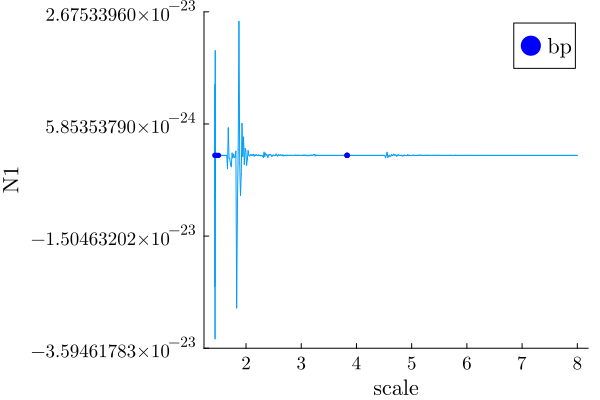

In [34]:
println(br_list.N2P_extinct)
plot(continuation(br_list.N2P_extinct, 2; bothside = true))

## Nice Plots 

In [76]:
pltN1 = plot_nice_bif(br_list, :N1, :scale)
savefig(pltN1, bif_fig_path*"N1_varyratio_type2.pdf")
pltN2 = plot_nice_bif(br_list, :N2, :scale)
savefig(pltN2, bif_fig_path*"N2_varyratio_type2.pdf")
pltxbar = plot_nice_bif(br_list, :mean_x, :scale)
savefig(pltxbar, bif_fig_path*"meanx_varyratio_type2.pdf")
pltNsum = plot_nice_bif(br_list, :Nsum, :scale)
savefig(pltNsum, bif_fig_path*"Nsum_varyratio_type2.pdf")

"/Users/taliaborofsky/Documents/CH_GroupFormation/CH_manuscript/FIgures/BifurcationDiagrams/Nsum_varyratio_type2.pdf"

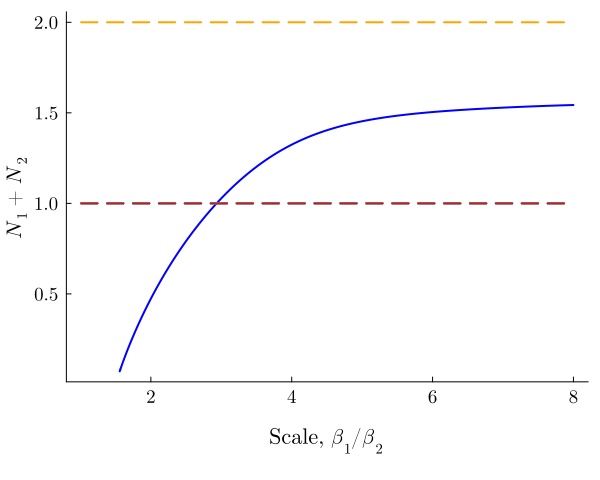

In [81]:
pltNsum = plot_nice_bif(br_list, :Nsum, :scale)


# Type II, vary $\eta_2$

In [104]:
params = copy(params_base)
params[:H1a] = params[:H2a] = 0.0
params[:H2b] = 1.0
params[:scale] = 4.0
println(params)
η2_upper = 6.0/7.0
x_max = params[:x_max]
u0 = fill(0.1, x_max+2)
p_nt = NamedTuple(scale_parameters(params))
sol, plotN1N2 = simulate_and_plot(u0, p_nt; tf = 500)
#display(plotN1N2)

vary_η2_params = (lens = (@optic _.η2), p_min = 0.01, 
p_max = η2_upper)

Dict{Symbol, Any}(:A1 => 0.6, :α1_of_1 => 0.05, :β2 => 1.0, :H2b => 1.0, :Tg => 0.01, :d => 100.0, :A2 => 0.5, :s1 => 2.0, :H1a => 0.0, :H2a => 0.0, :scale => 4.0, :x_max => 5, :α2_of_1 => 0.95, :η2 => 0.6, :α2_fun_type => "constant", :s2 => 2.0)


(lens = (@o _.η2), p_min = 0.01, p_max = 0.8571428571428571)

In [113]:
br_list = do_base_continuations(p_nt,5; lens = (@optic _.η2), p_min = 0.01, 
p_max = η2_upper)


(coexist =  ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 89
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter η2 starts at 0.8571428571428571, ends at 0.8571428571428571
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at η2 ≈ +0.85714286,                                                                     step =   0
- #  2,       bp at η2 ≈ +0.57755796 ∈ (+0.57664864, +0.57755796), |δp|=9e-04, [    guess], δ = (-1,  0), step =  20
- #  3,       bp at η2 ≈ +0.57664864 ∈ (+0.57664844, +0.57664864), |δp|=2e-07, [converged], δ = ( 1,  0), step =  21
- #  4,       bp at η2 ≈ +0.55854967 ∈ (+0.55854967, +0.55854967), |δp|=1e-15, [converged], δ = (-1,  0), step =  23
- #  5,       bp at η2 ≈ +0.80140929 ∈ (+0.80140928, +0.80140929), |δp|=8e-09, [converged], δ = ( 1,  0), step =  80
- #  6, endpoint at η2 ≈ +0.85714286,                                                                     step =  88
, predator_extinct =  ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 64
 ├─ T

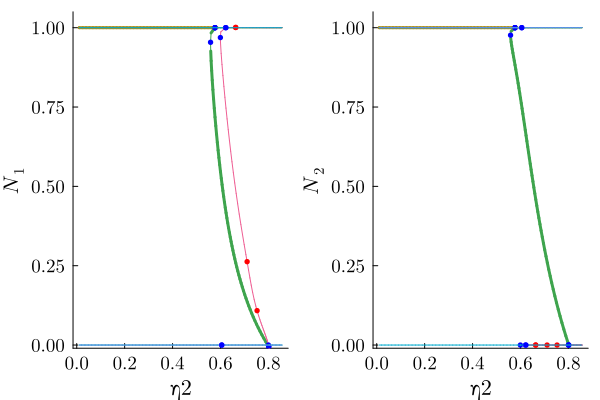

2-element Vector{Any}:
 Plot{Plots.GRBackend() n=14}
 Plot{Plots.GRBackend() n=14}

In [114]:
pltlist = plot_branches(br_list)
#plot!(xlabel = L"Small prey growth, $\eta_2$", tickfontsize = 10)
#methods(plot_branches)

### Predator Extinction

In [116]:
@unpack coexist, predator_extinct, N1_extinct, N2_extinct = br_list
@unpack N1P_extinct, N2P_extinct = br_list


(coexist =  ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 89
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter η2 starts at 0.8571428571428571, ends at 0.8571428571428571
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at η2 ≈ +0.85714286,                                                                     step =   0
- #  2,       bp at η2 ≈ +0.57755796 ∈ (+0.57664864, +0.57755796), |δp|=9e-04, [    guess], δ = (-1,  0), step =  20
- #  3,       bp at η2 ≈ +0.57664864 ∈ (+0.57664844, +0.57664864), |δp|=2e-07, [converged], δ = ( 1,  0), step =  21
- #  4,       bp at η2 ≈ +0.55854967 ∈ (+0.55854967, +0.55854967), |δp|=1e-15, [converged], δ = (-1,  0), step =  23
- #  5,       bp at η2 ≈ +0.80140929 ∈ (+0.80140928, +0.80140929), |δp|=8e-09, [converged], δ = ( 1,  0), step =  80
- #  6, endpoint at η2 ≈ +0.85714286,                                                                     step =  88
, predator_extinct =  ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 64
 ├─ T

In [117]:
println(predator_extinct)
println(predator_extinct.specialpoint[2].x)
br_P_extinct_extra = continuation(predator_extinct,2;bothside=true)


 ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 64
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter η2 starts at 0.01, ends at 0.8571428571428571
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at η2 ≈ +0.01000000,                                                                     step =   0
- #  2,       bp at η2 ≈ +0.57664614 ∈ (+0.57664614, +0.57665995), |δp|=1e-05, [converged], δ = ( 1,  0), step =  41
- #  3, endpoint at η2 ≈ +0.85714286,                                                                     step =  63

[1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0]


 ┌─ Curve type: EquilibriumCont from Transcritical bifurcation point.
 ├─ Number of points: 92
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter η2 starts at 0.8571428571428571, ends at 0.8571428571428571
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at η2 ≈ +0.85714286,                                                                     step =   0
- #  2,       bp at η2 ≈ +0.58467138 ∈ (+0.58320960, +0.58467138), |δp|=1e-03, [    guess], δ = (-1,  0), step =  20
- #  3,       bp at η2 ≈ +0.57660684 ∈ (+0.57660684, +0.57661170), |δp|=5e-06, [   guessL], δ = ( 1,  0), step =  22
- #  4,       bp at η2 ≈ +0.57640998 ∈ (+0.57640998, +0.57664614), |δp|=2e-04, [    guess], δ = ( 1,  0), step =  25
- #  5,       bp at η2 ≈ +0.55854967 ∈ (+0.55854967, +0.55854967), |δp|=9e-11, [converged], δ = (-1,  0), step =  27
- #  6,       bp at η2 ≈ +0.79737425 ∈ (+0.79737425, +0.79737425), |δp|=3e-10, [   guessL], δ = ( 1,  0), step =  82
- #  7,       bp at η2 ≈ +0.80140931 ∈ (+0.80140924, +0.

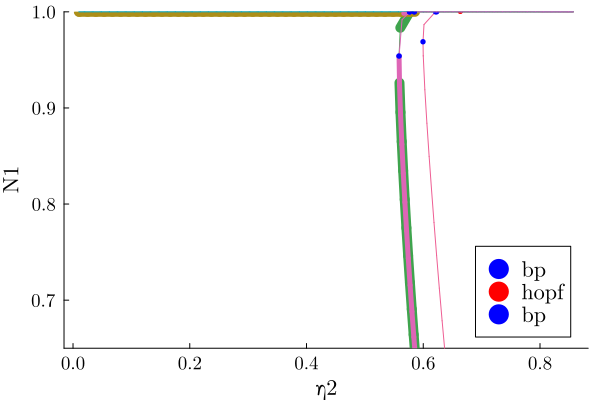

In [119]:
plot(br_list..., linewidthstable=10)
plot!(br_P_extinct_extra,linewidthstable=5) # this mostly overlaps with br_P_extinct, but fills in some of the weird instability

plot!(ylims = [.65,1])

So this adds a little bit

In [ ]:
br_list = (br_list..., predator_extinct2 = br_P_extinct_extra);

(coexist =  ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 89
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter η2 starts at 0.8571428571428571, ends at 0.8571428571428571
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at η2 ≈ +0.85714286,                                                                     step =   0
- #  2,       bp at η2 ≈ +0.57755796 ∈ (+0.57664864, +0.57755796), |δp|=9e-04, [    guess], δ = (-1,  0), step =  20
- #  3,       bp at η2 ≈ +0.57664864 ∈ (+0.57664844, +0.57664864), |δp|=2e-07, [converged], δ = ( 1,  0), step =  21
- #  4,       bp at η2 ≈ +0.55854967 ∈ (+0.55854967, +0.55854967), |δp|=1e-15, [converged], δ = (-1,  0), step =  23
- #  5,       bp at η2 ≈ +0.80140929 ∈ (+0.80140928, +0.80140929), |δp|=8e-09, [converged], δ = ( 1,  0), step =  80
- #  6, endpoint at η2 ≈ +0.85714286,                                                                     step =  88
, predator_extinct =  ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 64
 ├─ T

Now go over the bp's in this new branch

In [123]:
#extra_branch_list
to_continue_list =[]
for (i, pt) in enumerate(br_P_extinct_extra.specialpoint)
    println(pt.x)
    println(pt.type)
    if pt.type == :bp
        push!(to_continue_list,i)
    end
end

[1.0, 1.0, 8.728850308896818e-19, -4.510149849512769e-19, 2.110809009046497e-19, 3.720533021074449e-22, -4.605917260368211e-24]
endpoint
[1.0, 1.0, -1.543880889737407e-20, 7.98779857369457e-21, -3.739410335663443e-21, -6.571070149980051e-24, 8.162704265573039e-26]
bp
[1.0000000000000564, 1.000000000000127, -3.1377999760226947e-13, -2.3209363537815506e-14, -5.90023089588121e-15, -1.5170636717806006e-16, -5.889122981818436e-19]
bp
[0.9999615737479197, 0.99991487925677, 0.00020976507576328976, 1.601255427780694e-5, 4.184394033794708e-6, 1.093947399425647e-7, 4.27228460397892e-10]
bp
[0.9539380822355096, 0.9763587474127394, 0.0318455035181447, 0.014098375441577549, 0.019115612092210736, 0.0016471239129308834, 1.1526211924388914e-5]
bp
[-3.031563521799226e-10, 0.009380512203935392, 1.2439134671355976, 0.3105193685991776, 0.09600197983449044, 0.02145318606954576, 0.0037510883645732467]
bp
[-0.004959461340350586, -6.210063812873796e-8, 1.2527611578961186, 0.30871162332942764, 0.09358466474351

In [125]:
br_extraextra_list = []
for i in to_continue_list
    push!(br_extraextra_list,continuation(br_P_extinct_extra,i; nev = 6, bothside=true))
end

┌ Warning: The bifurcating eigenvalue is not that close to Re = 0. We found 0.01005774320857416 !≈ 0.  You can perhaps increase the argument `nev`.
└ @ BifurcationKit /Users/taliaborofsky/.julia/packages/BifurcationKit/Eq8JI/src/NormalForms.jl:36


All of these overlap, so br_P_extinct_extra is only useful

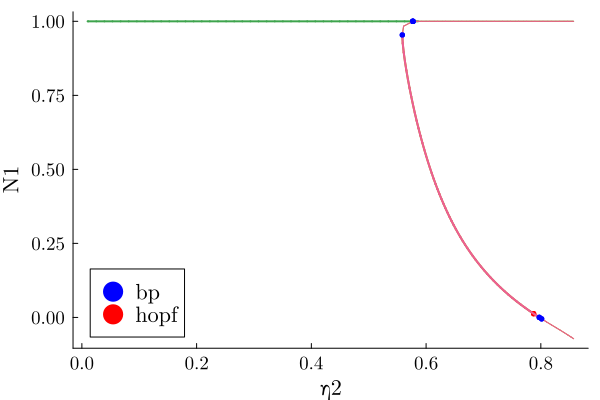

In [131]:
plot(br_extraextra_list[1], br_extraextra_list[2], vars = (:param, :N2)) # not separate
plot(br_extraextra_list[3], vars = (:param, :N1)) # basically just at N1 = 1
# br_extraextra_list 4 doesn't work
plot(predator_extinct, br_extraextra_list[5], br_extraextra_list[6] )

### Small Prey extinct

In [132]:
println(N2_extinct)


 ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 311
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter η2 starts at 0.8571428571428571, ends at 0.8571428571428571
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at η2 ≈ +0.85714286,                                                                     step =   0
- #  2,     hopf at η2 ≈ +0.66347237 ∈ (+0.66347226, +0.66347237), |δp|=1e-07, [converged], δ = (-2, -2), step =  14
- #  3,       bp at η2 ≈ +0.62093372 ∈ (+0.62084172, +0.62093372), |δp|=9e-05, [   guessL], δ = ( 1,  0), step =  18
- #  4,       bp at η2 ≈ +0.59955069 ∈ (+0.59955069, +0.59955069), |δp|=8e-11, [converged], δ = (-1,  0), step =  20
- #  5,     hopf at η2 ≈ +0.71109799 ∈ (+0.71109798, +0.71109799), |δp|=1e-08, [converged], δ = ( 2,  2), step =  43
- #  6,     hopf at η2 ≈ +0.75269500 ∈ (+0.75269167, +0.75269500), |δp|=3e-06, [converged], δ = (-2, -2), step =  50
- #  7,       bp at η2 ≈ +0.80000021 ∈ (+0.79999987, +0.80000021), |δp|=3e-07, [converged], δ

In [135]:
bif_pts_id = []
hopf_pts_id = []
for (i,pt) in enumerate(br_N2_extinct.specialpoint)
    if all(xi -> xi > 0 || abs(xi) < 1e-10, pt.x)
        if pt.type == :bf
            push!(bif_pts_id,i)
        elseif pt.type == :hopf
            push!(hopf_pts_id,i)
        end
    end
end

In [134]:
bif_pts_id

Any[]

In [138]:
hopf_pts_id

2-element Vector{Any}:
 5
 6

In [141]:
br_po1 = continuation(br_N2_extinct, 5, ContinuationPar(),
        PeriodicOrbitOCollProblem(20, 5)
        )

MethodError: MethodError: no method matching Float64(::ForwardDiff.Dual{ForwardDiff.Tag{BifurcationKit.var"#630#636"{BifurcationProblem{BifFunction{typeof(fullsystem_scaled), BifurcationKit.var"#104#122"{typeof(fullsystem_scaled)}, BifurcationKit.var"#108#126"{typeof(fullsystem_scaled)}, Nothing, BifurcationKit.var"#105#123"{typeof(fullsystem_scaled)}, Nothing, BifurcationKit.var"#107#125"{BifurcationKit.var"#105#123"{typeof(fullsystem_scaled)}}, BifurcationKit.var"#111#130"{BifurcationKit.var"#d1Fad#128"{typeof(fullsystem_scaled)}}, BifurcationKit.var"#113#132", BifurcationKit.var"#115#134", BifurcationKit.var"#117#136", Bool, Float64, BifurcationKit.Jet{Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}}, Vector{Float64}, @NamedTuple{A1::Float64, α1_of_1::Float64, β2::Float64, H2b::Float64, Tg::Float64, d::Float64, β1::Float64, η1::Float64, H1b::Float64, A2::Float64, s1::Float64, H1a::Float64, H2a::Float64, scale::Float64, x_max::Int64, α2_of_1::Float64, η2::Float64, α2_fun_type::String, s2::Float64}, PropertyLens{:η2}, typeof(BifurcationKit.plot_default), typeof(recordFromSolution), typeof(BifurcationKit.save_solution_default)}, @NamedTuple{A1::Float64, α1_of_1::Float64, β2::Float64, H2b::Float64, Tg::Float64, d::Float64, β1::Float64, η1::Float64, H1b::Float64, A2::Float64, s1::Float64, H1a::Float64, H2a::Float64, scale::Float64, x_max::Int64, α2_of_1::Float64, η2::Float64, α2_fun_type::String, s2::Float64}, PropertyLens{:η2}, Vector{Float64}}, Float64}, Float64, 1})
The type `Float64` exists, but no method is defined for this combination of argument types when trying to construct it.

Closest candidates are:
  (::Type{T})(::Real, !Matched::RoundingMode) where T<:AbstractFloat
   @ Base rounding.jl:265
  (::Type{T})(::T) where T<:Number
   @ Core boot.jl:900
  Float64(!Matched::UInt8)
   @ Base float.jl:245
  ...


### Some simulations to check for cycling

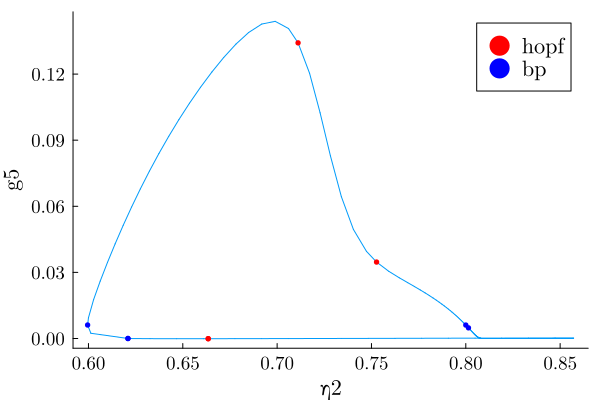

In [156]:
plot(N2_extinct, vars = (:param, :g5))

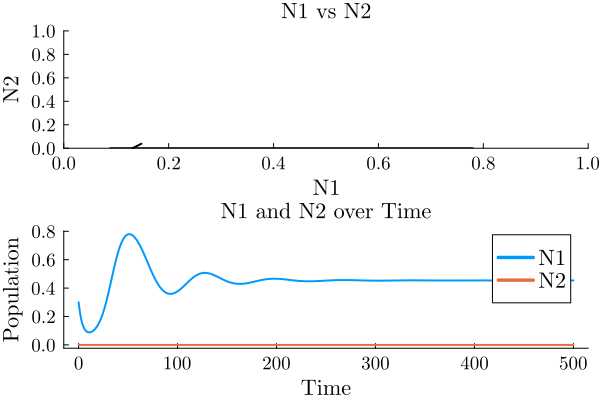

In [163]:
params_check = copy(params)
params_check[:η2] =  0.67
p_nt = NamedTuple(scale_parameters(params_check))
u0 = [0.3,0,0.1,0.5,0.1, 0.3, .05]

sol, plt = simulate_and_plot(u0, p_nt; tf = 500)
plt


### Coexistence

In [164]:
println(br_co)
println(br_co.specialpoint[2].x)
println(br_co.specialpoint[3].x)
br_co_extra = continuation(br_co,3;bothside=true)


 ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 89
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter η2 starts at 0.8571428571428571, ends at 0.8571428571428571
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at η2 ≈ +0.85714286,                                                                     step =   0
- #  2,       bp at η2 ≈ +0.57755796 ∈ (+0.57664864, +0.57755796), |δp|=9e-04, [    guess], δ = (-1,  0), step =  20
- #  3,       bp at η2 ≈ +0.57664864 ∈ (+0.57664844, +0.57664864), |δp|=2e-07, [converged], δ = ( 1,  0), step =  21
- #  4,       bp at η2 ≈ +0.55854967 ∈ (+0.55854967, +0.55854967), |δp|=1e-15, [converged], δ = (-1,  0), step =  23
- #  5,       bp at η2 ≈ +0.80140929 ∈ (+0.80140928, +0.80140929), |δp|=8e-09, [converged], δ = ( 1,  0), step =  80
- #  6, endpoint at η2 ≈ +0.85714286,                                                                     step =  88

[0.9999999999999927, 0.9999999999999625, 1.0091677399964106e-13, 5.146049987384073e-16, -1.87

 ┌─ Curve type: EquilibriumCont from Transcritical bifurcation point.
 ├─ Number of points: 64
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter η2 starts at 0.8571428571428571, ends at 0.01
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at η2 ≈ +0.85714286,                                                                     step =   0
- #  2,       bp at η2 ≈ +0.57667520 ∈ (+0.57664758, +0.57667520), |δp|=3e-05, [converged], δ = (-1,  0), step =  20
- #  3, endpoint at η2 ≈ +0.01000000,                                                                     step =  63


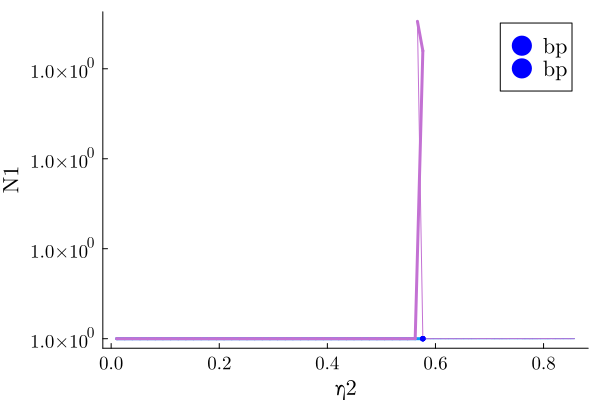

In [25]:
plot(continuation(br_co,2;bothside=true), linewidthstable = 3)
plot!(continuation(br_co,3;bothside=true), linewidthstable = 3)
plot!(continuation(br_co,4;bothside=true), linewidthstable = 3)

### Full Plot

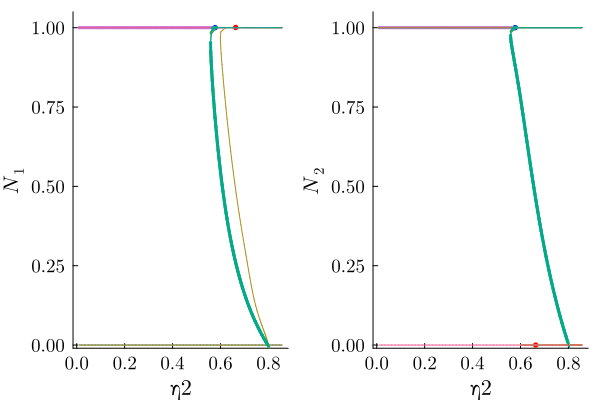

2-element Vector{Any}:
 Plot{Plots.GRBackend() n=9}
 Plot{Plots.GRBackend() n=9}

In [165]:
# Only the extra for predator extinct was useful, already added to list 

plt_list = plot_branches(br_list; plot_special_points = false)

## Nice Plots

In [196]:
plt_meanx = plot_nice_bif(br_list, :mean_x, :η2)
savefig(plt_meanx, bif_fig_path*"meanx_varyeta2_type2.pdf")

pltN1 = plot_nice_bif(br_list, :N1, :η2)
savefig(pltN1, bif_fig_path*"N1_varyeta2_type2.pdf")

pltN2 = plot_nice_bif(br_list, :N2, :η2)
savefig(pltN2, bif_fig_path*"N2_varyeta2_type2.pdf")

pltNsum = plot_nice_bif(br_list, :Nsum, :η2)
savefig(pltNsum, bif_fig_path*"Nsum_varyeta2_type2.pdf")

pltP = plot_nice_bif(br_list, :p, :η2)
savefig(pltP, bif_fig_path*"p_varyeta2_type2.pdf")
#plot_nice_bif(br_list, :g3, :η2)

"/Users/taliaborofsky/Documents/CH_GroupFormation/CH_manuscript/FIgures/BifurcationDiagrams/p_varyeta2_type2.pdf"

# Type II, Vary A1

In [26]:
params = copy(params_base)
params[:H1a] = params[:H2a] = 0.0
params[:H2b] = 1.0
params[:scale] = 6.0
params[:A1]=0.6
p_nt = NamedTuple(scale_parameters(params))

(A1 = 0.6, α1_of_1 = 0.05, β2 = 1.0, H2b = 1.0, Tg = 0.01, d = 100.0, β1 = 6.0, η1 = 0.09999999999999999, H1b = 7.199999999999999, A2 = 0.5, s1 = 2.0, H1a = 0.0, H2a = 0.0, scale = 6.0, x_max = 5, α2_of_1 = 0.95, η2 = 0.6, α2_fun_type = "constant", s2 = 2.0)

In [27]:
br_list = do_base_continuations(p_nt, 5; lens = (@optic _.A1), 
        p_min = 0.5, p_max = 1.5)

(coexist =  ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 75
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter A1 starts at 0.5, ends at 1.5
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at A1 ≈ +0.50000000,                                                                     step =   0
- #  2, endpoint at A1 ≈ +1.50000000,                                                                     step =  74
, predator_extinct =  ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 74
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter A1 starts at 0.5, ends at 1.5
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at A1 ≈ +0.50000000,                                                                     step =   0
- #  2, endpoint at A1 ≈ +1.50000000,                                                                     step =  73
, N2_extinct =  ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 75
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter A1 starts at 0.5, ends at 1.5

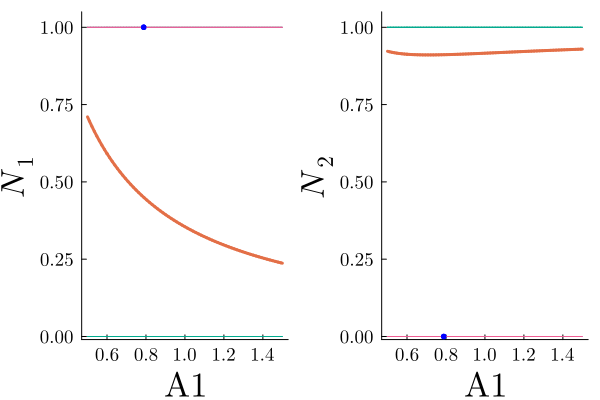

2-element Vector{Any}:
 Plot{Plots.GRBackend() n=9}
 Plot{Plots.GRBackend() n=9}

In [18]:
plot_branches(br_list)

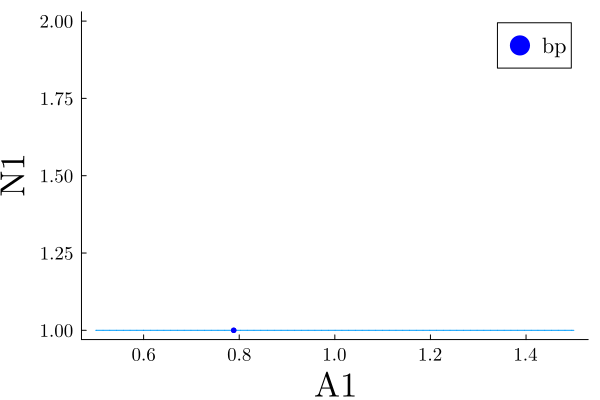

In [28]:
@unpack N2_extinct = br_list
plot(N2_extinct)

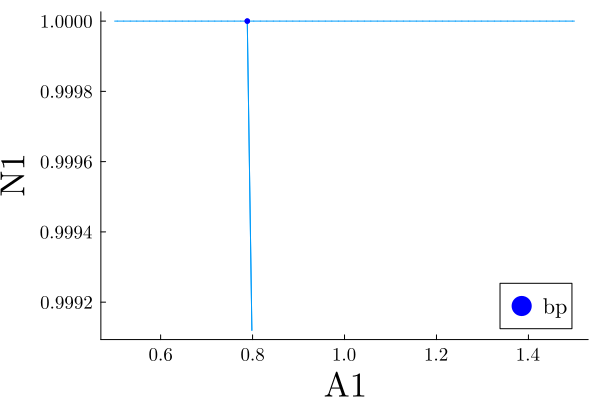

In [29]:
plot(continuation(N2_extinct,2;bothside=true))

## Nice Plot

In [21]:
plt_meanx = plot_nice_bif(br_list, :mean_x, :A1)
plot!(ylims=[1,4.6])
savefig(plt_meanx, bif_fig_path * "meanx_varyA1_type2.pdf")

"/Users/taliaborofsky/Documents/CH_GroupFormation/CH_manuscript/FIgures/BifurcationDiagrams/meanx_varyA1_type2.pdf"

In [22]:
pltN1 = plot_nice_bif(br_list, :N1, :A1)
savefig(pltN1, bif_fig_path * "N1_varyA1_type2.pdf")


"/Users/taliaborofsky/Documents/CH_GroupFormation/CH_manuscript/FIgures/BifurcationDiagrams/N1_varyA1_type2.pdf"

In [23]:
pltN2 = plot_nice_bif(br_list, :N2, :A1)
savefig(pltN2, bif_fig_path * "N2_varyA1_type2.pdf")



"/Users/taliaborofsky/Documents/CH_GroupFormation/CH_manuscript/FIgures/BifurcationDiagrams/N2_varyA1_type2.pdf"

In [24]:
pltNsum = plot_nice_bif(br_list, :Nsum, :A1)
plot!(ylims=[0,2])
savefig(pltNsum, bif_fig_path * "Nsum_varyA1_type2.pdf")



"/Users/taliaborofsky/Documents/CH_GroupFormation/CH_manuscript/FIgures/BifurcationDiagrams/Nsum_varyA1_type2.pdf"

In [25]:
pltp = plot_nice_bif(br_list, :p, :A1)
plot!(ylims=[0.0, 2.0])
savefig(pltp, bif_fig_path * "p_varyA1_type2.pdf")


"/Users/taliaborofsky/Documents/CH_GroupFormation/CH_manuscript/FIgures/BifurcationDiagrams/p_varyA1_type2.pdf"

# Type II, Vary Tg

In [274]:
params = copy(params_base)
params[:H1a] = params[:H2a] = 0.0
params[:H2b] = 1.0
params[:scale] = 6.0
params[:A1]=0.6
params[:Tg] = 0.1
p_nt = NamedTuple(scale_parameters(params))

(A1 = 0.6, α1_of_1 = 0.05, β2 = 1.0, H2b = 1.0, Tg = 0.1, d = 100.0, β1 = 6.0, η1 = 0.09999999999999999, H1b = 7.199999999999999, A2 = 0.5, s1 = 2.0, H1a = 0.0, H2a = 0.0, scale = 6.0, x_max = 5, α2_of_1 = 0.95, η2 = 0.6, α2_fun_type = "constant", s2 = 2.0)

In [275]:
br_list = do_base_continuations(p_nt, 5; lens = (@optic _.Tg), 
        p_min = 0.001, p_max = 1.0)

(coexist =  ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 74
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter Tg starts at 0.001, ends at 1.0
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at Tg ≈ +0.00100000,                                                                     step =   0
- #  2, endpoint at Tg ≈ +1.00000000,                                                                     step =  73
, predator_extinct =  ┌─ Curve type: EquilibriumCont
 ├─ Number of points: 74
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter Tg starts at 0.001, ends at 1.0
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at Tg ≈ +0.00100000,                                                                     step =   0
- #  2,       bp at Tg ≈ +0.00146383 ∈ (+0.00146383, +0.00146383), |δp|=3e-09, [converged], δ = ( 1,  0), step =   1
- #  3, endpoint at Tg ≈ +1.00000000,                                                                     step =  73
, N2_extinct =  ┌─ Curve type: 

In [264]:
br_list.predator_extinct
br_pred_extra = continuation(br_list.predator_extinct, 2; bothside = true)


 ┌─ Curve type: EquilibriumCont from Pitchfork bifurcation point.
 ├─ Number of points: 75
 ├─ Type of vectors: Vector{Float64}
 ├─ Parameter Tg starts at 0.001, ends at 1.0
 ├─ Algo: PALC
 └─ Special points:

- #  1, endpoint at Tg ≈ +0.00100000,                                                                     step =   0
- #  2,       bp at Tg ≈ +0.00100000 ∈ (+0.00100000, +0.00100000), |δp|=0e+00, [    guess], δ = ( 1,  0), step =   0
- #  3,       bp at Tg ≈ +0.00157911 ∈ (+0.00146383, +0.00157911), |δp|=1e-04, [    guess], δ = ( 1,  0), step =   3
- #  4, endpoint at Tg ≈ +1.00000000,                                                                     step =  74


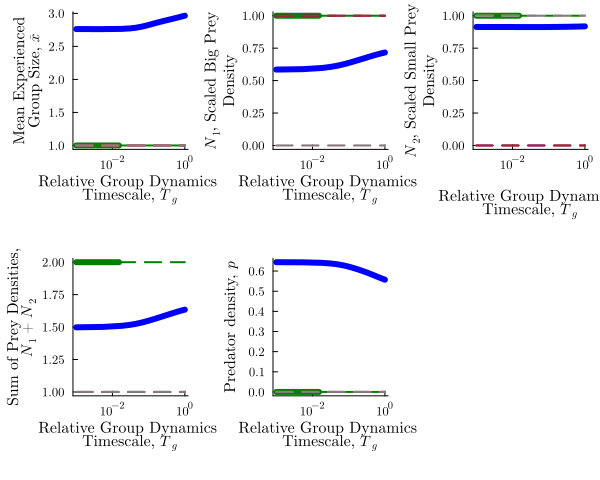

In [286]:
plt_meanx = plot_nice_bif(br_list, :mean_x, :Tg)
plot!(xscale = :log)
plot!(xlabel = "Relative Group Dynamics \nTimescale, "*L"T_g")

pltN1 = plot_nice_bif(br_list, :N1, :Tg)
plot!(xscale = :log)
plot!(xlabel = "Relative Group Dynamics \nTimescale, "*L"T_g")


pltN2 = plot_nice_bif(br_list, :N2, :Tg)
plot!(xscale = :log)

pltNsum = plot_nice_bif(br_list, :Nsum, :Tg)
plot!(xscale = :log)
plot!(xlabel = "Relative Group Dynamics \nTimescale, "*L"T_g")


pltP = plot_nice_bif(br_list, :p, :Tg)
plot!(xscale = :log)
plot!(xlabel = "Relative Group Dynamics \nTimescale, "*L"T_g")


#plot_nice_bif(br_list, :g3, :η2)
pltfull = plot(plt_meanx, pltN1, pltN2, pltNsum, pltP, layout = (2,3),
tickfontsize=8, guidefontsize = 10)

In [287]:
savefig(plt_meanx, bif_fig_path*"meanx_varyTg_type2.pdf")
savefig(pltN1, bif_fig_path*"N1_varyTg_type2.pdf")
savefig(pltN2, bif_fig_path*"N2_varyTg_type2.pdf")
savefig(pltNsum, bif_fig_path*"Nsum_varyTg_type2.pdf")
savefig(pltP, bif_fig_path*"p_varyTg_type2.pdf")

"/Users/taliaborofsky/Documents/CH_GroupFormation/CH_manuscript/FIgures/BifurcationDiagrams/p_varyTg_type2.pdf"

# Breaking input down into segments and plotting stability:

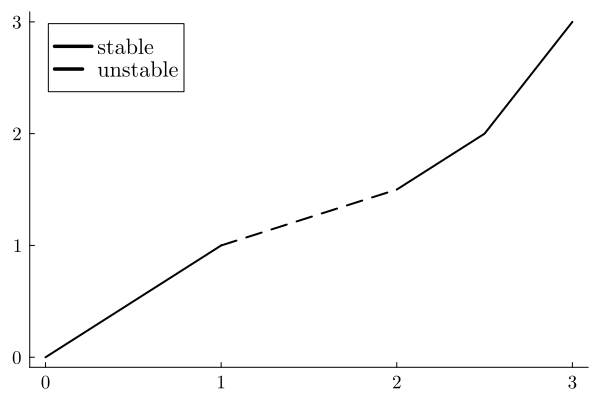

In [ ]:
using Plots


plot()
# Example usage
x_vec = [0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
y_vec = [0.0, 0.5, 1.0, 1.25, 1.5, 2.0, 3.0]
stability_vec = [true, true, false, false, true, true, false]  # Stability of each point

plt = plot_segments(x_vec, y_vec, stability_vec)
display(plt)

In [16]:
1.5*.5

0.75